In [7]:
# Import the required libraries.
import os
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [ ]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [ ]:
from IPython.display import HTML
from base64 import b64encode

# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

## **Visualize the Data with its Labels**

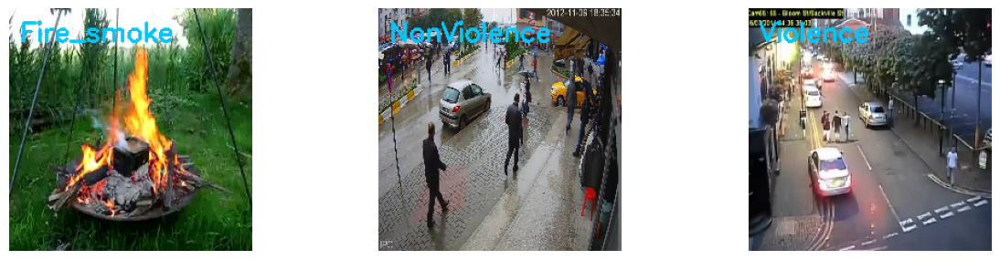

In [ ]:
plt.figure(figsize=(20, 20))

# Get the names of all classes/categories 
all_classes_names = os.listdir('Dataset')

# Iterate through all the classes in the dataset.
for counter, class_name in enumerate(all_classes_names, 1):

    # Retrieve the list of all the video files present in the Class Directory.
    video_files_names_list = os.listdir(f'Dataset/{class_name}')

    # Randomly select a video file from the list retrieved from the Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)

    # Initialize a VideoCapture object to read from the video File.
    video_reader = cv2.VideoCapture(f'Dataset/{class_name}/{selected_video_file_name}')
    
    # Check if the video reader is able to read the first frame of the video.
    if not video_reader.isOpened():
        print(f"Could not open video file: {selected_video_file_name}")
        continue
    
    # Read the first frame of the video file.
    ret, bgr_frame = video_reader.read()
    if not ret:
        print(f"Could not read frame from video file: {selected_video_file_name}")
        continue
    
    # Resize the frame.
    bgr_frame = cv2.resize(bgr_frame, (224, 224))

    # Release the VideoCapture object.
    video_reader.release()

    # Convert the frame from BGR into RGB format.
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Write the class name on the video frame.
    cv2.putText(rgb_frame, class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 200, 255), 2)

    # Display the frame.
    plt.subplot(5, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')


In [ ]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 32, 32

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 20

# Specify the directory containing the UCF50 dataset. 
DATASET_DIR = r"C:\Users\bazil\Desktop\Project\Dataset"

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST = ["NonViolence","Violence","Fire_smoke"]

### **Create a Function to Extract, Resize & Normalize Frames**

In [ ]:
def frames_extraction(video_path):
 
    frames_list = []
    
    # Read the Video File
    video_reader = cv2.VideoCapture(video_path)
 
    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)
 
    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        # Reading the frame from the video. 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
 
    video_reader.release()
 
    return frames_list

### **Create Dataset**

In [ ]:
def create_dataset():
 
    features = []
    labels = []
    video_files_paths = []
    
    # Iterating through all the classes.
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        
        # Iterate through all the files present in the files list.
        for file_name in files_list:
            
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
 
            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)
 
            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:
 
                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)
 
    features = np.asarray(features)
    labels = np.array(labels)  

    return features, labels, video_files_paths

In [ ]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: NonViolence
Extracting Data of Class: Violence
Extracting Data of Class: Fire_smoke


In [ ]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [ ]:
# Split the Data into Train ( 75% ) and Test Set ( 25% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.25, shuffle = True, random_state = seed_constant)

### **Create Model**


In [ ]:
def create_LRCN_model():
    '''
    This function will construct the required LRCN model.
    Returns:
        model: It is the required constructed LRCN model.
    '''

    # We will use a Sequential model for model construction.
    model = Sequential()
    
    # Define the Model Architecture.
    ########################################################################################################################
    
    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    model.add(TimeDistributed(MaxPooling2D((4, 4)))) 
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    #model.add(TimeDistributed(Dropout(0.25)))
                                      
    model.add(TimeDistributed(Flatten()))
                                      
    model.add(LSTM(32))
                                      
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    ########################################################################################################################

    # Display the models summary.
    model.summary()
    
    # Return the constructed LRCN model.
    return model

In [ ]:
def create_LRCN_model():
    '''
    This function will construct the required LRCN model.
    Returns:
        model: It is the required constructed LRCN model.
    '''

    # We will use a Sequential model for model construction.
    model = Sequential()
    
    # Define the Model Architecture.
    ########################################################################################################################
    
    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    model.add(TimeDistributed(MaxPooling2D((2, 2)))) 
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    #model.add(TimeDistributed(Dropout(0.25)))
                                      
    model.add(TimeDistributed(Flatten()))
                                      
    model.add(LSTM(32))
                                      
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    ########################################################################################################################

    # Display the models summary.
    model.summary()
    
    # Return the constructed LRCN model.
    return model


In [ ]:
# Construct the required LRCN model.
LRCN_model = create_LRCN_model()

# Display the success message.
print("Model Created Successfully!")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_12 (TimeDi  (None, 20, 32, 32, 16)   448       
 stributed)                                                      
                                                                 
 time_distributed_13 (TimeDi  (None, 20, 16, 16, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_14 (TimeDi  (None, 20, 16, 16, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_15 (TimeDi  (None, 20, 16, 16, 32)   4640      
 stributed)                                                      
                                                                 
 time_distributed_16 (TimeDi  (None, 20, 8, 8, 32)    

In [ ]:
# Create an Instance of Early Stopping Callback.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)
 
# Compile the model and specify loss function, optimizer and metrics to the model.
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 20, batch_size = 4 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/20
37/37 [==============================] - 91s 380ms/step - loss: 0.9232 - accuracy: 0.4797 - val_loss: 0.8097 - val_accuracy: 0.6216
Epoch 2/20
37/37 [==============================] - 6s 170ms/step - loss: 0.8756 - accuracy: 0.4595 - val_loss: 0.8169 - val_accuracy: 0.3784
Epoch 3/20
37/37 [==============================] - 7s 194ms/step - loss: 0.8561 - accuracy: 0.3919 - val_loss: 0.8068 - val_accuracy: 0.4324
Epoch 4/20
37/37 [==============================] - 5s 133ms/step - loss: 0.8521 - accuracy: 0.5338 - val_loss: 0.8639 - val_accuracy: 0.3784
Epoch 5/20
37/37 [==============================] - 5s 126ms/step - loss: 0.8488 - accuracy: 0.5270 - val_loss: 0.7879 - val_accuracy: 0.6216
Epoch 6/20
37/37 [==============================] - 5s 134ms/step - loss: 0.8205 - accuracy: 0.5743 - val_loss: 0.7363 - val_accuracy: 0.6757
Epoch 7/20
37/37 [==============================] - 6s 152ms/step - loss: 0.7927 - accuracy: 0.6014 - val_loss: 0.7436 - val_accuracy: 0.5405
Epoch

In [ ]:
# Evaluate the trained model.
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

2/2 [==============================] - 5s 1s/step - loss: 0.5336 - accuracy: 0.8065


In [ ]:
from tensorflow.keras.models import save_model
# Save the model to disk
save_model(LRCN_model, 'LRCN_model.h5')

### **Evaluate Model**

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Get the Epochs Count
    epochs = range(len(metric_value_1))
 
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)
 
    plt.title(str(plot_name))
 
    plt.legend()

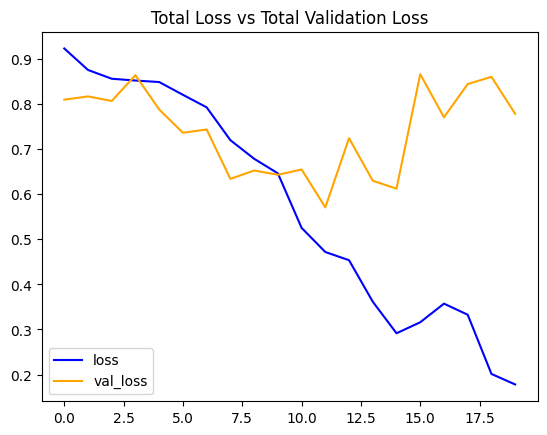

In [ ]:
# Visualize the training and validation loss metrices.
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

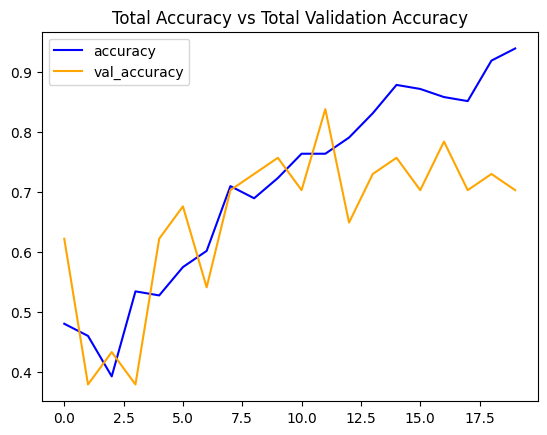

In [ ]:
# Visualize the training and validation accuracy metrices.
plot_metric(LRCN_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

### **Predicting the Test Set**

In [ ]:
labels_predict = LRCN_model.predict(features_test)

2/2 [==============================] - 5s 274ms/step


In [ ]:
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)

In [ ]:
labels_test_normal.shape , labels_predict.shape

((62,), (62,))

In [ ]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.8064516129032258


### **Prediction done frame by frame**

In [ ]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform action recognition on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    output_file_path: The path where the ouput video with the predicted action being performed overlayed will be stored.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Initialize the VideoWriter Object to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        # Read the frame.
        ok, frame = video_reader.read() 
        
        # Check if frame is not read properly then break the loop.
        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]

        # Write predicted class name on top of the frame.
        cv2.putText(frame, predicted_class_name, (20, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)


        # Write The frame into the disk using the VideoWriter Object.
        video_writer.write(frame)
        
    # Release the VideoCapture and VideoWriter objects.
    video_reader.release()
    video_writer.release()

In [ ]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path): 

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))
        
    for counter, random_index in enumerate(random_range, 1):
        
        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.  
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
          
        ok, frame = video_reader.read() 

        if not ok:
          break 

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame)
        plt.gcf().set_size_inches(20,20)
        plt.tight_layout()
                            
    video_reader.release()




In [ ]:
# Construct the output video path.
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

### **Predicting on Violence Data**

1/1 [==============================] - 0s 75ms/step


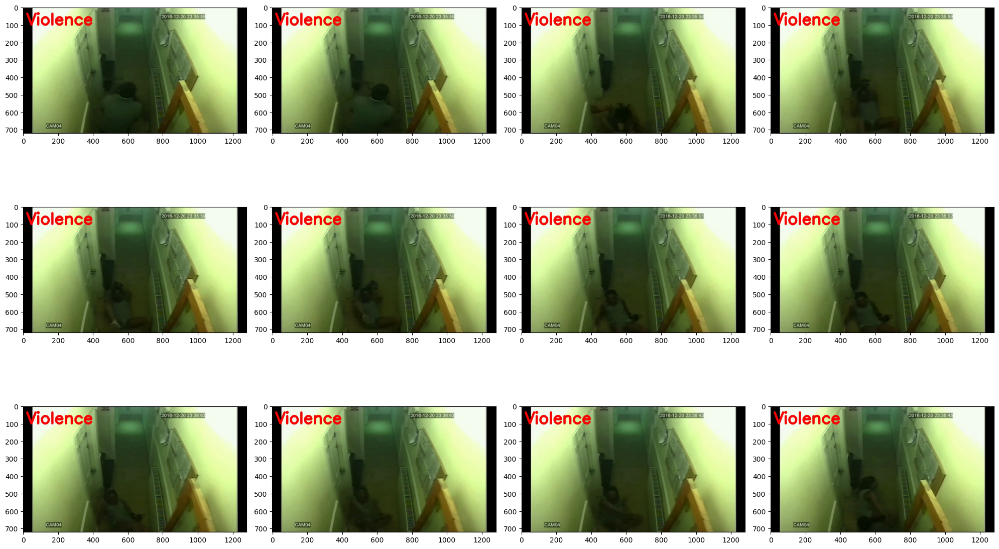

In [ ]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\bazil\Desktop\Project\Dataset\Violence\V26.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [ ]:
# Play the actual video
Play_Video(input_video_file_path)

### **Predicting on Non-Violence Data**

1/1 [==============================] - 0s 47ms/step


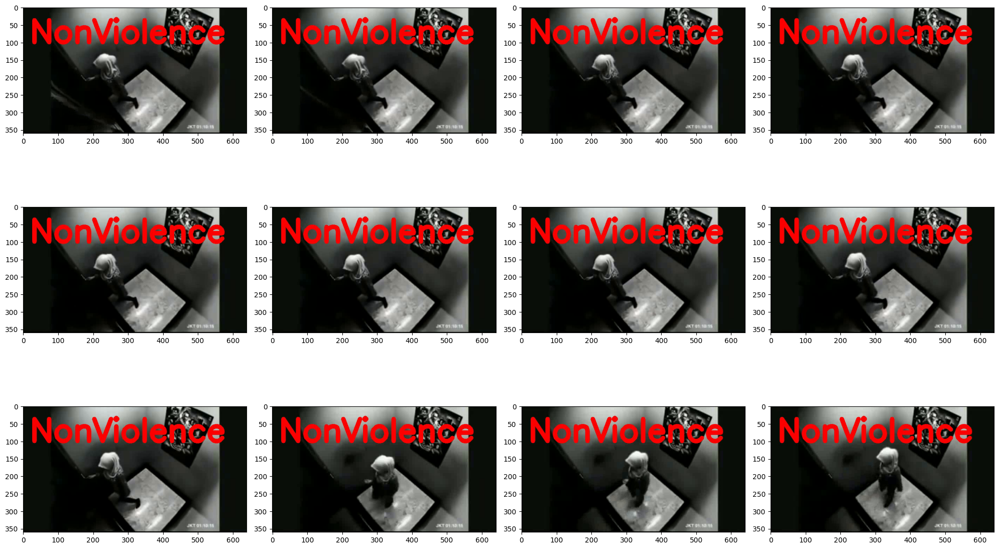

In [ ]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\bazil\Desktop\Project\Dataset\NonViolence\nv50.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [ ]:
# Play the actual video
Play_Video(input_video_file_path)

### **Predicting on Fire Smoke**

1/1 [==============================] - 0s 47ms/step


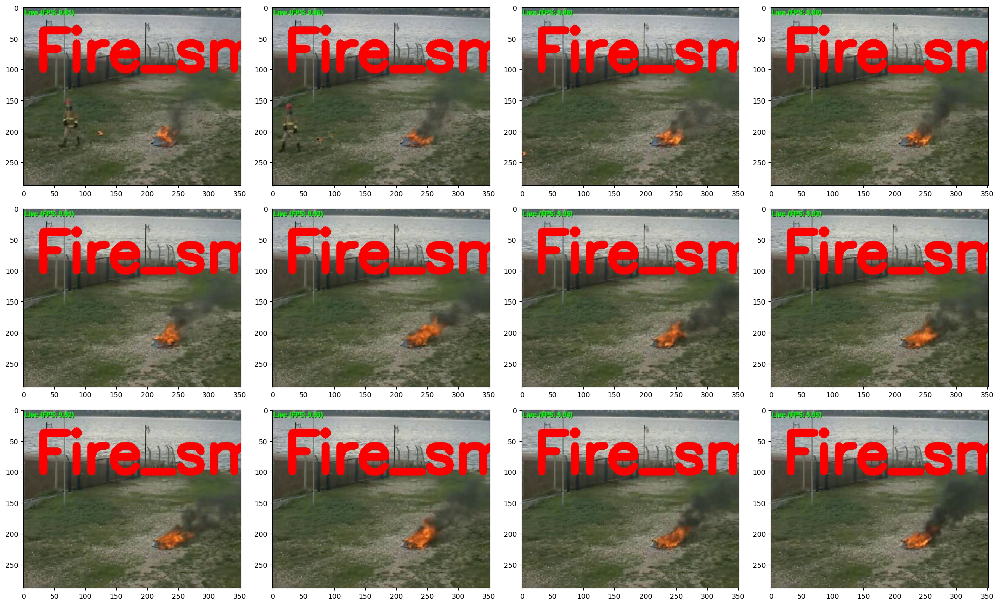

In [ ]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\bazil\Desktop\Project\Dataset\Fire_smoke\posVideo6.875.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [ ]:
# Play the actual video
Play_Video(input_video_file_path)

### **Prediction on Unkown video**

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Define your class labels
class_labels = ["non-violence", "violence", "Fire_smoke"]

# Create a label encoder and fit it to your class labels
label_encoder = LabelEncoder()
label_encoder.fit(class_labels)

# Convert your class labels to integers using the label encoder
class_labels_encoded = label_encoder.transform(class_labels)

# Manually set the value of "violence" to 1
class_labels_encoded[list(class_labels).index("violence")] = 2

# Convert your integer labels back to class labels
class_labels_decoded = label_encoder.inverse_transform(class_labels_encoded)

print(class_labels_decoded)


['non-violence' 'violence' 'Fire_smoke']


In [ ]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
 
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
 
    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)
 
    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    video_reader.release()

In [ ]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\bazil\Desktop\Project\New folder\V_266.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 95ms/step
Predicted: Violence
Confidence: 0.5031836032867432


In [ ]:
import os
import shutil

# Specify the input video file path
input_video_file_path = r"C:\Users\bazil\Desktop\Project\Dataset\Violence\V14.mp4"

# Specify the output video file path
output_video = os.path.join("Violence", "new_video_name.mp4")

# Create the 'Output' directory if it does not exist
os.makedirs("Violence", exist_ok=True)

# Copy the input video file to the 'Output' directory with a different name
shutil.copy(input_video_file_path, output_video)

# Perform single prediction on the copied video
predict_video(output_video, SEQUENCE_LENGTH)


1/1 [==============================] - 0s 145ms/step
Predicted: Violence
Confidence: 0.9642458558082581


In [ ]:

# Check if violence was detected
if prediction == 1 :
    # Send an email with the video where violence was detected
    email_address = 'finalyrproject23@gmail.com'
    email_password = 'gubjkajaztkdmtty'
    recipient_address = 'bahirofficial@gmail.com'
    subject = 'Violence detected in video'
    message = 'A video containing violence has been detected.'
    
    # Attach the video to the email
    filename = 'new_video_name.mp4'
    attachment = open(filename, 'rb')
    p = MIMEBase('application', 'octet-stream')
    p.set_payload((attachment).read())
    encoders.encode_base64(p)
    p.add_header('Content-Disposition', 'attachment', filename=filename)
    
    # Create the email message
    msg = MIMEMultipart()
    msg['From'] = email_address
    msg['To'] = recipient_address
    msg['Subject'] = subject
    msg.attach(MIMEText(message))
    msg.attach(p)
    
    # Send the email
    with smtplib.SMTP_SSL('smtp.gmail.com', 465) as smtp:
        smtp.login(email_address, email_password)
        smtp.sendmail(email_address, recipient_address, msg.as_string())

In [ ]:
import os
import shutil

# Specify the input video file path
input_video_file_path = r"C:\Users\bazil\Desktop\Project\Dataset\Fire_smoke\posVideo9.878.mp4"

# Specify the output video file path
output_video = os.path.join("Firesmoke", "new_video_name1.mp4")

# Create the 'Output' directory if it does not exist
os.makedirs("Firesmoke", exist_ok=True)

# Copy the input video file to the 'Output' directory with a different name
shutil.copy(input_video_file_path, output_video)

# Perform single prediction on the copied video
predict_video(output_video, SEQUENCE_LENGTH)


1/1 [==============================] - 0s 274ms/step
Predicted: Fire_smoke
Confidence: 0.9161323308944702


In [ ]:
# Check if violence was detected
if prediction == 3:
    # Send an email with the video where violence was detected
    email_address = 'finalyrproject23@gmail.com'
    email_password = 'gubjkajaztkdmtty'
    recipient_address = 'bahirofficial@gmail.com'
    subject = 'Fire and Smoke detected in video'
    message = 'A video containing Fire and Smoke has been detected.'
    
    # Attach the video to the email
    filename = 'new_video_name1.mp4'
    attachment = open(filename, 'rb')
    p = MIMEBase('application', 'octet-stream')
    p.set_payload((attachment).read())
    encoders.encode_base64(p)
    p.add_header('Content-Disposition', 'attachment', filename=filename)
    
    # Create the email message
    msg = MIMEMultipart()
    msg['From'] = email_address
    msg['To'] = recipient_address
    msg['Subject'] = subject
    msg.attach(MIMEText(message))
    msg.attach(p)
    
    # Send the email
    with smtplib.SMTP_SSL('smtp.gmail.com', 465) as smtp:
        smtp.login(email_address, email_password)
        smtp.sendmail(email_address, recipient_address, msg.as_string())

In [ ]:
import smtplib
import imghdr
from email.message import EmailMessage

EMAIL_ADDRESS = 'finalyrproject23@gmail.com'
EMAIL_PASSWORD = 'gubjkajaztkdmtty'

email_receiver = ['bahirofficial@gmail.com']


msg = EmailMessage()
msg['Subject'] = 'Alert through mail with attachment'
msg['From'] = EMAIL_ADDRESS
msg['To'] = email_receiver
msg.set_content('Alert through mail with attachment Check out this Violence video')

if predict_video == "Violence":  # replace with the variable name that stores the prediction
    # send the email with the predicted video attachment
    files = [output_video]  # replace with the path to the output video
    for file in files:
        with open(file,'rb') as f:
            file_data = f.read()
            file_type = 'video\mp4'
            file_name = f.name
        msg.add_attachment(file_data, maintype='video', subtype=file_type, filename=file_name)
    msg.set_content('Violence detected. Attached is the predicted video.')

  

with smtplib.SMTP_SSL('smtp.gmail.com', 465) as smtp:
    smtp.login(EMAIL_ADDRESS, EMAIL_PASSWORD)
    smtp.send_message(msg)
    smtp.send_message()


NameError: name 'predict_video' is not defined

In [ ]:
ridha.isha20@gmail.com

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.6,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)
 
# Compiling the model 
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
 
# Fitting the model 
LRCN_model__history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 20, batch_size = 4 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

NameError: name 'MoBiLSTM_model' is not defined

In [ ]:
import smtplib
import imghdr
from email.message import EmailMessage

EMAIL_ADDRESS = 'finalyrproject23@gmail.com'
EMAIL_PASSWORD = 'gubjkajaztkdmtty'

email_receiver = ['ridha.isha20@gmail.com','maiseridha@gmail.com']


msg = EmailMessage()
msg['Subject'] = 'Alert through mail with attachment'
msg['From'] = EMAIL_ADDRESS
msg['To'] = email_receiver

if predict_video == "Violence":  # replace with the variable name that stores the prediction
    import os
    os.makedirs('Output', exist_ok=True)  # create the 'Output' directory if it does not exist
    output_path = r"C:\Users\bazil\Desktop\Project\Violence"  # replace with the desired path and filename for the output video
    # write the predicted video to the output path
    with open(output_path, 'wb') as f:
        f.write(predicted_video_bytes)  # replace with the bytes of the predicted video
    # send the email with the predicted video attachment
    files = [output_path]  # replace with the path to the output video
    for file in files:
        with open(file,'rb') as f:
            file_data = f.read()
            file_type = 'video/mp4'
            file_name = f.name
        msg.add_attachment(file_data, maintype='video', subtype=file_type, filename=file_name)
    msg.set_content('Violence detected. Attached is the predicted video.')
else:
    msg.set_content('No violence detected.')

with smtplib.SMTP_SSL('smtp.gmail.com', 465) as smtp:
    smtp.login(EMAIL_ADDRESS, EMAIL_PASSWORD)
    smtp.send_message(msg)


In [ ]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\Lenovo\OneDrive\Desktop\Detection\test_videos_directory\V10.mp4"

# Perform Single Prediction on the Test Video.
predicted_video_bytes = predict_video(input_video_file_path, SEQUENCE_LENGTH)  # replace with the function call that returns the bytes of the predicted video


if predict_video == "Violence":
    import os
    os.makedirs('Output', exist_ok=True)  # create the 'Output' directory if it does not exist
    output_path = r"C:\Users\Lenovo\OneDrive\Desktop\Detection\Output"  # replace with the desired path and filename for the output video
    with open(output_path, 'wb') as f:
        f.write(predicted_video_bytes)  # write the predicted video to the output path
    import smtplib
    import imghdr
    from email.message import EmailMessage

    EMAIL_ADDRESS = 'finalyrproject23@gmail.com'
    EMAIL_PASSWORD = 'gubjkajaztkdmtty'

    email_receiver = ['ridha.isha20@gmail.com','maiseridha@gmail.com']

    msg = EmailMessage()
    msg['Subject'] = 'Alert through mail with attachment'
    msg['From'] = EMAIL_ADDRESS
    msg['To'] = email_receiver

    files = [output_path]
    for file in files:
        with open(file, 'rb') as f:
            file_data = f.read()
            file_type = 'video/mp4'
            file_name = f.name
        msg.add_attachment(file_data, maintype='video', subtype=file_type, filename=file_name)
        msg.set_content('Violence detected. Attached is the video.')
else:
    msg.set_content('No violence detected.')

with smtplib.SMTP_SSL('smtp.gmail.com', 465) as smtp:
    smtp.login(EMAIL_ADDRESS, EMAIL_PASSWORD)
    smtp.send_message(msg)




1/1 [==============================] - 0s 27ms/step
Predicted: Violence
Confidence: 0.9984061121940613


In [ ]:
import os
import smtplib
import imghdr
from email.message import EmailMessage

# Specify the input video file path
input_video_file_path = r"C:\Users\Lenovo\OneDrive\Desktop\Detection\test_videos_directory\V10.mp4"

# Perform single prediction on the test video
predicted_label = predict_video(input_video_file_path, SEQUENCE_LENGTH)

# If predicted label is "Violence", store the video and send it as an attachment via email
if predicted_label == "Violence":
    # Create a directory named "Output" if it doesn't exist already
    os.makedirs('Output', exist_ok=True)

    # Set the output video file path
    output_video = os.path.join('Output', 'violence_detected.mp4')

    # Store the predicted video in the "Output" directory
    os.rename(input_video_file_path, output_video)

    # Set up email parameters
    EMAIL_ADDRESS = 'finalyrproject23@gmail.com'
    EMAIL_PASSWORD = 'gubjkajaztkdmtty'
    email_receiver = ['ridha.isha20@gmail.com','maiseridha@gmail.com']

    msg = EmailMessage()
    msg['Subject'] = 'Alert: Violence detected in video'
    msg['From'] = EMAIL_ADDRESS
    msg['To'] = email_receiver
    msg.set_content('A video containing violent content has been detected.')

    # Add the predicted video as an attachment to the email
    with open(output_video_file_path, 'rb') as f:
        file_data = f.read()
        file_name = os.path.basename(output_video)
        file_type = imghdr.what(f.name)

    msg.add_attachment(file_data, maintype='video', subtype='mp4', filename=file_name)

    # Send the email
    with smtplib.SMTP_SSL('smtp.gmail.com', 465) as smtp:
        smtp.login(EMAIL_ADDRESS, EMAIL_PASSWORD)
        smtp.send_message(msg)


1/1 [==============================] - 0s 33ms/step
Predicted: Violence
Confidence: 0.9984061121940613


In [ ]:
import os
import smtplib
import imghdr
from email.message import EmailMessage



if predict_video == "Violence":
    # Create a folder named Output if it does not exist
    os.makedirs('Output', exist_ok=True)

    # Specify the output video file path
    output_path = os.path.join('Output', 'output.mp4')

    # Save the output video
    save_video(output_path)

   
    EMAIL_ADDRESS = 'finalyrproject23@gmail.com'
    EMAIL_PASSWORD = 'gubjkajaztkdmtty'
    email_receiver = ['ridha.isha20@gmail.com','maiseridha@gmail.com']

    msg = EmailMessage()
    msg['Subject'] = 'Alert: Violence detected in video'
    msg['From'] = EMAIL_ADDRESS
    msg['To'] = email_receiver
    msg.set_content('A video containing violent content has been detected.')


    # Attach the output video file to the email message
    with open(output_path, 'rb') as f:
        file_data = f.read()
        file_type = imghdr.what(f.name)
        file_name = f.name
    msg.add_attachment(file_data, maintype='video', subtype=file_type, filename=file_name)

    # Set the email message content based on the predicted class
    if predicted_class == "Violence":
        msg.set_content('Violence detected. Attached is the video.')
    else:
        msg.set_content('No violence detected.')

    # Send the email message
    with smtplib.SMTP_SSL('smtp.gmail.com', 465) as smtp:
        smtp.login(EMAIL_ADDRESS, EMAIL_PASSWORD)
        smtp.send_message(msg)


In [ ]:
import os
import shutil

# Specify the input video file path
input_video_file_path = r"C:\Users\bazil\Desktop\Project\New folder"

# Specify the output video file path
output_video = os.path.join("Output", "new_video_name.mp4")

# Create the 'Output' directory if it does not exist
os.makedirs("Output", exist_ok=True)

# Copy the input video file to the 'Output' directory with a different name
shutil.copy(input_video_file_path, output_video)

# Perform single prediction on the copied video
predict_video(output_video, SEQUENCE_LENGTH)


# If predicted label is "Violence", store the video and send it as an attachment via email
if predicted_label == "Violence":
   
    # Set up email parameters
    EMAIL_ADDRESS = 'finalyrproject23@gmail.com'
    EMAIL_PASSWORD = 'gubjkajaztkdmtty'
    email_receiver = ['ridha.isha20@gmail.com','maiseridha@gmail.com']

    msg = EmailMessage()
    msg['Subject'] = 'Alert: Violence detected in video'
    msg['From'] = EMAIL_ADDRESS
    msg['To'] = email_receiver
    msg.set_content('A video containing violent content has been detected.')


    files = [r'C:\Users\Lenovo\OneDrive\Desktop\Detection\Output']
    for file in files:
        with open(file, 'rb') as f:
            file_data = f.read()
            file_type = 'video/mp4'
            file_name = f.name
        msg.add_attachment(file_data, maintype='video', subtype=file_type, filename=file_name)
        msg.set_content('Violence detected. Attached is the video.')

    # Add the predicted video as an attachment to the email
    with open(output_video, 'rb') as f:
        file_data = f.read()
        file_name = os.path.basename(output_video)
        file_type = imghdr.what(f.name)

    msg.add_attachment(file_data, maintype='video', subtype='mp4', filename=file_name)
    msg.set_content('Violence detected. Attached is the video.')

    # Send the email
    with smtplib.SMTP_SSL('smtp.gmail.com', 465) as smtp:
        smtp.login(EMAIL_ADDRESS, EMAIL_PASSWORD)
        smtp.send_message(msg)


1/1 [==============================] - 0s 51ms/step
Predicted: Violence
Confidence: 0.9984061121940613
